#**Case de IA**

Enunciado do Case
* O objetivo é analisar todas as informações e fornecer uma previsão de vendas por loja 
* Preste bastante atenção nas variáveis utilizadas. Quais delas fazem sentido para a previsão do modelo? Quais são apenas sujeira? O entendimento do negócio é fundamental para o desenvolvimento de um bom modelo. Sinta-se à vontade para criar novas variáveis também à partir dos dados existentes

#**Sumário**

- ### 1. Imports
- ### 2. Leitura e entendimento das bases de dados
- ### 3. Jutnando as bases
- ### 4. Pré-processamento pt. 1
- ### 5. Análise exploratória
- ### 6. Pré-processamento pt. 2
- ### 7. Modelagem
- ### 8. Tunagem de hiperparâmetros
        8.1. Otimização Bayesiana
        8.2. Busca aleatória
        8.3. Otimização por evolução
- ### 9. Avaliação do modelo
- ### 10. COnsiderações finais


# 1. Imports

In [1]:
pip install scikit-optimize

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.3/100.3 kB 4.1 MB/s eta 0:00:00


In [2]:
pip install skopt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Could not find a version that satisfies the requirement skopt (from versions: none)
ERROR: No matching distribution found for skopt


In [3]:
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import seaborn as sns
import pandas as pd
from google.colab import drive
drive.mount('/content/drive')
import numpy as np
from sklearn.tree import DecisionTreeRegressor  
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error
import matplotlib.pyplot as plt
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error
from skopt import BayesSearchCV
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from scipy.stats import randint
from sklearn.metrics import make_scorer
from skopt import gp_minimize
from skopt.space import Real, Integer
from functools import partial
from sklearn.model_selection import cross_val_score

Mounted at /content/drive


# 2. Leitura e entendimento das bases de dados

Dataset Features 
* Store - ID da loja 
* Date - Data da semana 
* Temperature - Temperatura média na região 
* Fuel_price - Preço do combustível na região 
* Markdown - Promoções/remarcações - disponível apenas depois de Nov/21
* CPI - Inflação no período 
* Unemployment - Taxa de desemprego 
* isHoliday - Se a semana é um feriado ou não 

In [4]:
# Lendo a base features
df_features = pd.read_csv('/content/drive/MyDrive/FEA.dev/IA/Case/Features data set.csv')
df_features.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
0,1,05/02/2010,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False
1,1,12/02/2010,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True
2,1,19/02/2010,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False
3,1,26/02/2010,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False
4,1,05/03/2010,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False


In [5]:
# Transformando Date em datetime e IsHoliday em números inteiros
df_features['Date'] = pd.to_datetime(df_features['Date'], format = "%d/%m/%Y")
df_features['IsHoliday'] = df_features[["IsHoliday"]].applymap(int)
df_features.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,0
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,1
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,0
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,0
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,0


Dataset Stores
* Store - ID da loja 
* Type - Tipo baseado no tamanho da loja 
* Size - Tamanho da loja 

In [6]:
# Lendo a base stores
df_stores = pd.read_csv('/content/drive/MyDrive/FEA.dev/IA/Case/stores data-set.csv')
df_stores.head()

,Store,Type,Size
0,1,A,151315
1,2,A,202307
2,3,B,37392
3,4,A,205863
4,5,B,34875


Dataset Sales 
* Store - ID da loja 
* Dept - O número do departamento 
* Date - Data da semana 
* Weekly_sales - Vendas por departamento em cada loja 
* isHoliday - Se a semana é um feriado ou não 

In [7]:
# Lendo a base sales
df_sales = pd.read_csv('/content/drive/MyDrive/FEA.dev/IA/Case/sales data-set.csv')
df_sales.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday
0,1,1,05/02/2010,24924.50,False
1,1,1,12/02/2010,46039.49,True
2,1,1,19/02/2010,41595.55,False
3,1,1,26/02/2010,19403.54,False
4,1,1,05/03/2010,21827.90,False


In [8]:
# Transformando Date em datetime e IsHoliday em números inteiros
df_sales['Date'] = pd.to_datetime(df_sales['Date'], format = "%d/%m/%Y")
df_sales['IsHoliday'] = df_sales[["IsHoliday"]].applymap(int)
df_sales

,Store,Dept,Date,Weekly_Sales,IsHoliday
0,1,1,2010-02-05,24924.50,0
1,1,1,2010-02-12,46039.49,1
2,1,1,2010-02-19,41595.55,0
3,1,1,2010-02-26,19403.54,0
4,1,1,2010-03-05,21827.90,0
...,...,...,...,...,...
421565,45,98,2012-09-28,508.37,0
421566,45,98,2012-10-05,628.10,0
421567,45,98,2012-10-12,1061.02,0
421568,45,98,2012-10-19,760.01,0


# 3. Juntando as bases

In [9]:
# Juntando sales e stores + excluindo IsHoliday (já tem na base features)
df_merged = pd.merge(df_sales, df_stores, on='Store')
df_merged.drop(['IsHoliday'], axis=1, inplace=True)
df_merged

,Store,Dept,Date,Weekly_Sales,Type,Size
0,1,1,2010-02-05,24924.50,A,151315
1,1,1,2010-02-12,46039.49,A,151315
2,1,1,2010-02-19,41595.55,A,151315
3,1,1,2010-02-26,19403.54,A,151315
4,1,1,2010-03-05,21827.90,A,151315
...,...,...,...,...,...,...
421565,45,98,2012-09-28,508.37,B,118221
421566,45,98,2012-10-05,628.10,B,118221
421567,45,98,2012-10-12,1061.02,B,118221
421568,45,98,2012-10-19,760.01,B,118221


In [10]:
# Juntando o df anterior com features
df_final = pd.merge(df_merged, df_features, on=['Store', 'Date'])
df_final

,Store,Dept,Date,Weekly_Sales,Type,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
0,1,1,2010-02-05,24924.50,A,151315,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,0
1,1,2,2010-02-05,50605.27,A,151315,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,0
2,1,3,2010-02-05,13740.12,A,151315,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,0
3,1,4,2010-02-05,39954.04,A,151315,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,0
4,1,5,2010-02-05,32229.38,A,151315,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
421565,45,93,2012-10-26,2487.80,B,118221,58.85,3.882,4018.91,58.08,100.0,211.94,858.33,192.308899,8.667,0
421566,45,94,2012-10-26,5203.31,B,118221,58.85,3.882,4018.91,58.08,100.0,211.94,858.33,192.308899,8.667,0
421567,45,95,2012-10-26,56017.47,B,118221,58.85,3.882,4018.91,58.08,100.0,211.94,858.33,192.308899,8.667,0
421568,45,97,2012-10-26,6817.48,B,118221,58.85,3.882,4018.91,58.08,100.0,211.94,858.33,192.308899,8.667,0


# 4. Pré-processamento pt. 1

Realizando processamento de dados necessários para facilitar a análise exploratória inicial

In [11]:
# Verificando os tipos de dados
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 421570 entries, 0 to 421569
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   Store         421570 non-null  int64         
 1   Dept          421570 non-null  int64         
 2   Date          421570 non-null  datetime64[ns]
 3   Weekly_Sales  421570 non-null  float64       
 4   Type          421570 non-null  object        
 5   Size          421570 non-null  int64         
 6   Temperature   421570 non-null  float64       
 7   Fuel_Price    421570 non-null  float64       
 8   MarkDown1     150681 non-null  float64       
 9   MarkDown2     111248 non-null  float64       
 10  MarkDown3     137091 non-null  float64       
 11  MarkDown4     134967 non-null  float64       
 12  MarkDown5     151432 non-null  float64       
 13  CPI           421570 non-null  float64       
 14  Unemployment  421570 non-null  float64       
 15  IsHoliday     421

In [12]:
# Analisando estatísticas descritivas das colunas quantitativas do df
df_final.describe()

,Store,Dept,Weekly_Sales,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
count,421570.000000,421570.000000,421570.000000,421570.000000,421570.000000,421570.000000,150681.000000,111248.000000,137091.000000,134967.000000,151432.000000,421570.000000,421570.000000,421570.000000
mean,22.200546,44.260317,15981.258123,136727.915739,60.090059,3.361027,7246.420196,3334.628621,1439.421384,3383.168256,4628.975079,171.201947,7.960289,0.070358
std,12.785297,30.492054,22711.183519,60980.583328,18.447931,0.458515,8291.221345,9475.357325,9623.078290,6292.384031,5962.887455,39.159276,1.863296,0.255750
min,1.000000,1.000000,-4988.940000,34875.000000,-2.060000,2.472000,0.270000,-265.760000,-29.100000,0.220000,135.160000,126.064000,3.879000,0.000000
25%,11.000000,18.000000,2079.650000,93638.000000,46.680000,2.933000,2240.270000,41.600000,5.080000,504.220000,1878.440000,132.022667,6.891000,0.000000
50%,22.000000,37.000000,7612.030000,140167.000000,62.090000,3.452000,5347.450000,192.000000,24.600000,1481.310000,3359.450000,182.318780,7.866000,0.000000
75%,33.000000,74.000000,20205.852500,202505.000000,74.280000,3.738000,9210.900000,1926.940000,103.990000,3595.040000,5563.800000,212.416993,8.572000,0.000000
max,45.000000,99.000000,693099.360000,219622.000000,100.140000,4.468000,88646.760000,104519.540000,141630.610000,67474.850000,108519.280000,227.232807,14.313000,1.000000


In [13]:
# Verificando se há dados faltantes
df_final.isna().sum()

Store                0
Dept                 0
Date                 0
Weekly_Sales         0
Type                 0
Size                 0
Temperature          0
Fuel_Price           0
MarkDown1       270889
MarkDown2       310322
MarkDown3       284479
MarkDown4       286603
MarkDown5       270138
CPI                  0
Unemployment         0
IsHoliday            0
dtype: int64

In [14]:
# Preenchendo dados faltantes com 0
df_final = df_final.fillna(0)
df_final.head()

,Store,Dept,Date,Weekly_Sales,Type,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
0,1,1,2010-02-05,24924.50,A,151315,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,0
1,1,2,2010-02-05,50605.27,A,151315,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,0
2,1,3,2010-02-05,13740.12,A,151315,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,0
3,1,4,2010-02-05,39954.04,A,151315,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,0
4,1,5,2010-02-05,32229.38,A,151315,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,0


# 5. Análise exploratória

Entendendo quais variáveis são mais relevantes para explicar o comportamento das vendas

In [15]:
# Agrupando as vendas de toda as lojas e departamentos por semana
grouped2 = df_final.groupby(pd.Grouper(key='Date', freq='W')).agg({'Weekly_Sales': 'sum'})

# Plotando o gráfico
fig = px.line(grouped2, x=grouped2.index, y='Weekly_Sales', title='Evolução das Vendas Semanais')
fig.show()

In [16]:
# Agrupando a coluna de vendas e as colunas de Markdown por loja
grouped3 = df_final.groupby('Store').agg({'Weekly_Sales': 'sum', 'MarkDown1':'sum', 'MarkDown2':'sum',
                                         'MarkDown3':'sum', 'MarkDown4':'sum', 'MarkDown5':'sum'})

# Criando outra variáveis (Markdown total)
grouped3['Total_MarkDown'] = grouped3['MarkDown1'] + grouped3['MarkDown2'] + grouped3['MarkDown3'] + grouped3['MarkDown4'] + grouped3['MarkDown5']
grouped3.head()

,Weekly_Sales,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,Total_MarkDown
Store,,,,,,,
1,2.224028e+08,29573172.77,8946002.16,4468507.74,13732804.50,18386470.50,7.510696e+07
2,2.753824e+08,39058007.29,16088974.79,6226127.85,17427365.75,23984630.72,1.027851e+08
3,5.758674e+07,9983368.61,2659078.45,2607992.20,2870236.34,4116018.04,2.223669e+07
4,2.995440e+08,34440267.52,14186418.01,7054847.27,18897288.62,25044270.57,9.962309e+07
5,4.547569e+07,9711211.82,2701165.39,2116352.74,3555011.57,8236390.98,2.632013e+07


In [17]:
# Removendo valores iguais a zero na coluna Total_MarkDown
grouped3 = grouped3.drop(grouped3[grouped3['Total_MarkDown'] == 0].index)

In [18]:
# Plotando gráfico
fig = px.scatter(grouped3, x='Total_MarkDown', y='Weekly_Sales', title='Dispersão entre Vendas Semanais e Promoções ou Remarcações')
fig.show()

In [19]:
# Agrupando a quantidade de lojas e as vendas semanais para cada tipo de loja
grouped1 = df_final.groupby('Type').agg({'Weekly_Sales': 'sum', 'Store': 'nunique'})

# Criando uma variável de vendas semanais por loja
grouped1['Weekly_Sales_per_Stores'] = grouped1['Weekly_Sales']/grouped1['Store']
grouped1

,Weekly_Sales,Store,Weekly_Sales_per_Stores
Type,,,
A,4.331015e+09,22,1.968643e+08
B,2.000701e+09,17,1.176883e+08
C,4.055035e+08,6,6.758392e+07


In [20]:
# Plotando o gráfico
fig = px.histogram(grouped1, x=grouped1.index, y='Weekly_Sales_per_Stores', color = grouped1.index, width=800, height=400, title='Vendas semanais por loja para cada tipo')
fig.show()

In [21]:
# Agrupando vendas semanais e tamanho da loja por loja
grouped4 = df_final.groupby('Store').agg({'Weekly_Sales': 'sum', 'Size':'unique', 'Type':'unique'})

# Transformando size em número inteiro e type em string (eram listas)
grouped4['Size'] = grouped4['Size'].astype(int)
grouped4['Type'] = grouped4['Type'].apply(lambda x: ', '.join(x))
grouped4.head()

,Weekly_Sales,Size,Type
Store,,,
1,2.224028e+08,151315,A
2,2.753824e+08,202307,A
3,5.758674e+07,37392,B
4,2.995440e+08,205863,A
5,4.547569e+07,34875,B


In [22]:
# Plotando gráfico
fig = px.scatter(grouped4, x='Size', y='Weekly_Sales', color='Type', title='Dispersão entre Tamanho da Loja e Vendas Semanais')
fig.show()

In [23]:
# Agrupando montante de vendas semanais e quantidade de vendas semanais por IsHoliday
grouped5 = df_final.groupby('IsHoliday').agg({'Weekly_Sales': ['sum', 'count']}).reset_index()

# Transoformando IsHoliday em string para separar no gráfico
grouped5['IsHoliday'] = grouped5['IsHoliday'].astype(str)

# Criando variável valor médio das vendas
grouped5['Average_Weekly_Sales'] = grouped5['Weekly_Sales', 'sum']/grouped5['Weekly_Sales', 'count']
grouped5

IsHoliday  Weekly_Sales         Average_Weekly_Sales
                      sum   count                     
0         0  6.231919e+09  391909         15901.445069
1         1  5.052996e+08   29661         17035.823187

In [24]:
# Plotando gráfico
fig = px.histogram(grouped5, x='IsHoliday', y='Average_Weekly_Sales', color = 'IsHoliday', width=800, height=400, title='Valor Médio das Vendas para cada IsHoliday')
fig.show()

In [25]:
# Agrupando vendas semanais e temperatura média por loja
grouped6 = df_final.groupby('Store').agg({'Weekly_Sales': 'sum', 'Temperature':'mean'})
grouped6.head()

,Weekly_Sales,Temperature
Store,,
1,2.224028e+08,68.224463
2,2.753824e+08,68.105435
3,5.758674e+07,71.298627
4,2.995440e+08,62.176867
5,4.547569e+07,69.203619


In [26]:
# Plotando gráfico
fig = px.scatter(grouped6, x='Temperature', y='Weekly_Sales', title='Dispersão entre Temperatura média da região e Vendas semanais por loja')
fig.show()

In [27]:
# Agrupando soma de vendas e inflação média por semana
grouped7 = df_final.groupby(pd.Grouper(key='Date', freq='W')).agg({'Weekly_Sales': 'sum', 'CPI':'mean'})
grouped7.tail()

,Weekly_Sales,CPI
Date,,
2012-09-30,43734899.40,175.919639
2012-10-07,47566639.31,175.998254
2012-10-14,46128514.25,176.123786
2012-10-21,45122410.57,176.295499
2012-10-28,45544116.29,176.182886


In [28]:
# Plotando gráfico
fig = px.line(grouped7, x=grouped7.index, y='Weekly_Sales')

fig.add_trace(
    go.Scatter(x=grouped7.index, y=grouped7['CPI'], name='CPI',
               yaxis='y2', mode='lines', line=dict(color='red'))
)

fig.update_layout(
    title='Comparando Evolução de Vendas Semanais e da Inflação',
    yaxis=dict(title='Weekly Sales'),
    yaxis2=dict(title='CPI', overlaying='y', side='right')
)

fig.show()

In [29]:
# Agrupando soma de vendas e preço médio do combustível por semana
grouped8 = df_final.groupby(pd.Grouper(key='Date', freq='W')).agg({'Weekly_Sales': 'sum', 'Fuel_Price':'mean'})
grouped8.tail()

,Weekly_Sales,Fuel_Price
Date,,
2012-09-30,43734899.40,3.858245
2012-10-07,47566639.31,3.848435
2012-10-14,46128514.25,3.897425
2012-10-21,45122410.57,3.878413
2012-10-28,45544116.29,3.791086


In [30]:
# Plotando gráfico
fig = px.line(grouped8, x=grouped8.index, y='Weekly_Sales')

fig.add_trace(
    go.Scatter(x=grouped8.index, y=grouped8['Fuel_Price'], name='Fuel_Price',
               yaxis='y2', mode='lines', line=dict(color='green'))
)

fig.update_layout(
    title='Comparando Evolução de Vendas Semanais e do Preço do Combustível',
    yaxis=dict(title='Weekly Sales'),
    yaxis2=dict(title='Fuel_Price', overlaying='y', side='right')
)

fig.show()

In [31]:
# Agrupando soma de vendas e taxa média de desemprego por semana
grouped9 = df_final.groupby(pd.Grouper(key='Date', freq='W')).agg({'Weekly_Sales': 'sum', 'Unemployment':'mean'})
grouped9.tail()

,Weekly_Sales,Unemployment
Date,,
2012-09-30,43734899.40,7.225855
2012-10-07,47566639.31,6.942141
2012-10-14,46128514.25,6.952682
2012-10-21,45122410.57,6.948928
2012-10-28,45544116.29,6.943212


In [32]:
# Plotando gráfico
fig = px.line(grouped9, x=grouped9.index, y='Weekly_Sales')

fig.add_trace(
    go.Scatter(x=grouped9.index, y=grouped9['Unemployment'], name='Unemployment',
               yaxis='y2', mode='lines', line=dict(color='orange'))
)

fig.update_layout(
    title='Comparando Evolução de Vendas Semanais e da Taxa de Desemprego',
    yaxis=dict(title='Weekly Sales'),
    yaxis2=dict(title='Unemployment', overlaying='y', side='right')
)

fig.show()

In [33]:
# Calculando share de cada departamento no total de vendas
df_share = df_final.groupby('Dept')['Weekly_Sales'].sum() / df_final['Weekly_Sales'].sum()

# Selecionando departamentos com share acima de 2%
limite_share = 0.02
dept_selecionados = df_share[df_share >= limite_share].index.tolist()

# Juntando departamentos com share abaixo do 2% em "Outros"
df_final2 = df_final.copy()
df_final2['Dept_Class'] = df_final2['Dept'].apply(lambda x: x if x in dept_selecionados else 'Outros')

# Calculando share de cada categoria
df_share_categoria = pd.DataFrame(df_final2.groupby('Dept_Class')['Weekly_Sales'].sum() / df_final2['Weekly_Sales'].sum())
df_share_categoria

,Weekly_Sales
Dept_Class,
2,0.041651
4,0.024809
5,0.020128
7,0.023077
8,0.028837
13,0.029288
23,0.020510
38,0.058350
40,0.042887


In [34]:
# Plotando gráfico de pizza
fig = px.pie(df_share_categoria, values='Weekly_Sales', names=df_share_categoria.index, title='Share de vendas por departamento')
fig.show()

# 6. Pré-processamento pt. 2

In [35]:
# Criando uma nova variável com a soma dos MarkDowns
df_final['MarkDown'] = df_final['MarkDown1'] + df_final['MarkDown2'] + df_final['MarkDown3'] + df_final['MarkDown4'] + df_final['MarkDown5']
df_final.drop(['Type', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5'], axis=1, inplace=True)
df_final.head()

,Store,Dept,Date,Weekly_Sales,Size,Temperature,Fuel_Price,CPI,Unemployment,IsHoliday,MarkDown
0,1,1,2010-02-05,24924.50,151315,42.31,2.572,211.096358,8.106,0,0.0
1,1,2,2010-02-05,50605.27,151315,42.31,2.572,211.096358,8.106,0,0.0
2,1,3,2010-02-05,13740.12,151315,42.31,2.572,211.096358,8.106,0,0.0
3,1,4,2010-02-05,39954.04,151315,42.31,2.572,211.096358,8.106,0,0.0
4,1,5,2010-02-05,32229.38,151315,42.31,2.572,211.096358,8.106,0,0.0


In [36]:
# Selecionando as colunas desejadas
cols = ['Size', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment', 'MarkDown']

# Criando a figura com subplots
fig = make_subplots(rows=2, cols=3)

# Loop para adicionar cada boxplot
for i, col in enumerate(cols):
    # Adicionando o boxplot à figura
    fig.add_trace(
        px.box(df_final, y=col).data[0],
        row=i//3 + 1, col=i%3 + 1
    )

    # Atualizando o título do subplot
    fig.update_xaxes(title_text=col, row=i//3 + 1, col=i%3 + 1)
    fig.update_yaxes(title_text=None, row=i//3 + 1, col=i%3 + 1)

# Exibindo a figura
fig.show()

In [37]:
# Criando função para remover outliers
def removeoutlier(values):
    fator = 1.5
    q3, q1 = np.percentile(values, [75, 25])
    iqr = q3 - q1
    lowpass = q1 - (iqr * fator)
    highpass = q3 + (iqr * fator)
    filtered_values = []
    for v in values:
        if v > lowpass and v < highpass:
            filtered_values.append(v)
        else:
            filtered_values.append(float('nan'))
    return pd.Series(filtered_values)

# Aplicando a função removeoutlier em cada coluna
df_filtered = df_final.loc[:,['Temperature', 'Unemployment', 'MarkDown']].apply(removeoutlier)

In [38]:
# Reagrupando os dados
df_tratado = pd.merge(df_final.loc[:, ['Store', 'Dept', 'Date', 'Size', 'Weekly_Sales', 'IsHoliday', 'Fuel_Price', 'CPI',]], df_filtered, left_index=True, right_index=True)
df_tratado.head()

,Store,Dept,Date,Size,Weekly_Sales,IsHoliday,Fuel_Price,CPI,Temperature,Unemployment,MarkDown
0,1,1,2010-02-05,151315,24924.50,0,2.572,211.096358,42.31,8.106,0.0
1,1,2,2010-02-05,151315,50605.27,0,2.572,211.096358,42.31,8.106,0.0
2,1,3,2010-02-05,151315,13740.12,0,2.572,211.096358,42.31,8.106,0.0
3,1,4,2010-02-05,151315,39954.04,0,2.572,211.096358,42.31,8.106,0.0
4,1,5,2010-02-05,151315,32229.38,0,2.572,211.096358,42.31,8.106,0.0


In [39]:
# Transformando o dado sobre data em um número inteiro a partir da diferença entre as datas e a data mínima do dataset
df_tratado['Date'] = pd.to_datetime(df_tratado['Date'])
df_tratado['Date'] = df_tratado['Date'] - df_tratado['Date'].min()
df_tratado['Date'] = df_tratado['Date'].dt.days
df_tratado.sort_values(by=['Store','Dept','Date'])

,Store,Dept,Date,Size,Weekly_Sales,IsHoliday,Fuel_Price,CPI,Temperature,Unemployment,MarkDown
0,1,1,0,151315,24924.50,0,2.572,211.096358,42.31,8.106,0.00
73,1,1,7,151315,46039.49,1,2.548,211.242170,38.51,8.106,0.00
145,1,1,14,151315,41595.55,0,2.514,211.289143,39.93,8.106,0.00
218,1,1,21,151315,19403.54,0,2.561,211.319643,46.63,8.106,0.00
290,1,1,28,151315,21827.90,0,2.625,211.350143,46.50,8.106,0.00
...,...,...,...,...,...,...,...,...,...,...,...
421302,45,98,966,118221,508.37,0,3.997,192.013558,64.88,8.684,9468.01
421370,45,98,973,118221,628.10,0,3.985,192.170412,64.89,8.667,9659.00
421436,45,98,980,118221,1061.02,0,4.000,192.327265,54.47,8.667,6554.03
421502,45,98,987,118221,760.01,0,3.969,192.330854,56.47,8.667,3982.42


In [40]:
# Normalizar os dados numéricos usando MinMaxScaler
scaler_minmax = MinMaxScaler()
normalized_data = scaler_minmax.fit_transform(df_tratado)

# Padronizar os dados normalizados usando StandardScaler
scaler_std = StandardScaler()
standardized_data = scaler_std.fit_transform(normalized_data)

# Adicionar os dados em um novo DataFrame
df_normalized_standardized = pd.DataFrame(standardized_data, columns=df_tratado.columns)
df_normalized_standardized.head()

,Store,Dept,Date,Size,Weekly_Sales,IsHoliday,Fuel_Price,CPI,Temperature,Unemployment,MarkDown
0,-1.658199,-1.418742,-1.724605,0.239209,0.393782,-0.275106,-1.720834,1.018774,-0.965168,0.327197,-0.513955
1,-1.658199,-1.385947,-1.724605,0.239209,1.524538,-0.275106,-1.720834,1.018774,-0.965168,0.327197,-0.513955
2,-1.658199,-1.353151,-1.724605,0.239209,-0.098680,-0.275106,-1.720834,1.018774,-0.965168,0.327197,-0.513955
3,-1.658199,-1.320356,-1.724605,0.239209,1.055551,-0.275106,-1.720834,1.018774,-0.965168,0.327197,-0.513955
4,-1.658199,-1.287560,-1.724605,0.239209,0.715425,-0.275106,-1.720834,1.018774,-0.965168,0.327197,-0.513955


<Axes: >

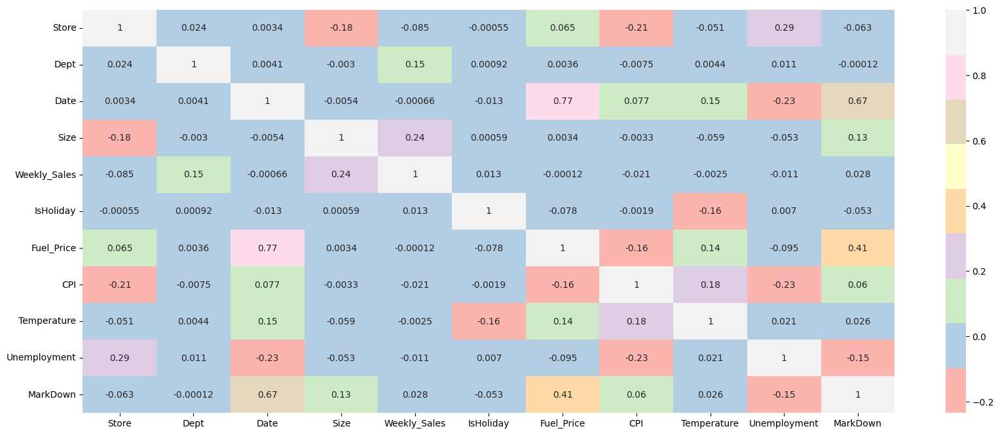

In [41]:
# Analisando mapa de correlação
plt.figure(figsize=(20,8))
sns.heatmap(df_tratado.corr(), annot = True, cmap= "Pastel1")

# 7. Modelagem

Algoritmo utilizado: Árvore de Decisão
- Maior precisão dos dados previstos quando comparado com regressões estatísticas convencionais

In [87]:
# Separando a variável target e os inputs
target = df_tratado.loc[:,'Weekly_Sales']
inputs = df_tratado.drop(['Weekly_Sales','Temperature','Fuel_Price','CPI','Unemployment'], axis='columns')

In [88]:
inputs

,Store,Dept,Date,Size,IsHoliday,MarkDown
0,1,1,0,151315,0,0.00
1,1,2,0,151315,0,0.00
2,1,3,0,151315,0,0.00
3,1,4,0,151315,0,0.00
4,1,5,0,151315,0,0.00
...,...,...,...,...,...,...
421565,45,93,994,118221,0,5247.26
421566,45,94,994,118221,0,5247.26
421567,45,95,994,118221,0,5247.26
421568,45,97,994,118221,0,5247.26


In [89]:
target

0         24924.50
1         50605.27
2         13740.12
3         39954.04
4         32229.38
            ...   
421565     2487.80
421566     5203.31
421567    56017.47
421568     6817.48
421569     1076.80
Name: Weekly_Sales, Length: 421570, dtype: float64

In [90]:
# Dividindo os dados em conjuntos de treinamento e teste
X_train, X_test, y_train, y_test = train_test_split(inputs, target, test_size=0.1)

# Criando um imputer para preencher os valores NaN
imputer = SimpleImputer(strategy='mean')

# Treinando o imputer nos dados
X_train = imputer.fit_transform(X_train)
X_test = imputer.transform(X_test)

## Árvore de Decisão

In [91]:
# Criando a classe DecisionTreeRegressor
tree_reg = DecisionTreeRegressor(random_state=42)

# Treinando o modelo
tree_reg.fit(X_train, y_train)

# Aplicando previsão nos dados de teste
y_pred = tree_reg.predict(X_test)

In [92]:
# Aplicação do imputer aos dados
inputs = imputer.fit_transform(inputs)

# Avaliando o desempenho do modelo
r2_a = r2_score(y_test, y_pred)
mae_a = mean_absolute_error(y_test, y_pred)
mse_a = mean_squared_error(y_test, y_pred)
rmse_a = mean_squared_error(y_test, y_pred, squared=False)
scores_a = cross_val_score(tree_reg, X_train, y_train, cv=10, scoring='r2')

In [93]:
print("Média dos scores de validação cruzada: {:.2f}".format(scores_a.mean()))
print('R²:', r2_a)
print('MAE:', mae_a)
print('MSE:', mse_a)
print('RMSE:', rmse_a)

Média dos scores de validação cruzada: 0.94
R²: 0.9258026509819421
MAE: 1953.430657779254
MSE: 39551621.39370684
RMSE: 6289.0079816857315


In [94]:
# Agrupando os dados para comparar real x previsto e separar a análise por loja
df_plot = pd.DataFrame({'Store':X_test[:,0], 'Dept': X_test[:,1], 'Data': X_test[:,2], 'Real': y_test, 'Previsto': y_pred})
df_plot.head()

,Store,Dept,Data,Real,Previsto
260505,27.0,54.0,364.0,20.00,142.52
402167,43.0,1.0,616.0,7162.77,6139.79
293948,31.0,31.0,21.0,2049.00,1790.74
95694,10.0,79.0,784.0,34318.18,42458.82
369001,39.0,54.0,798.0,5.88,19.88


In [95]:
# Somando as vendas previstas e realizadas de todas as lojas por data
grouped10 = df_plot.groupby('Data').agg({'Real': 'sum', 'Previsto': 'sum'})
grouped10.head()

,Real,Previsto
Data,,
0.0,5408637.35,5254301.98
7.0,5065317.33,5102639.01
14.0,4753259.04,4679677.27
21.0,4229378.86,4507688.11
28.0,5760779.93,5544942.79


In [96]:
# Plotando o gráfico de linhas
fig = px.line(grouped10, x=grouped10.index, y='Real')

fig.add_trace(
    go.Scatter(x=grouped10.index, y=grouped10['Real'], name='Real',
               mode='lines', line=dict(color='blue'))
)

fig.add_trace(
    go.Scatter(x=grouped10.index, y=grouped10['Previsto'], name='Previsto',
               yaxis='y2', mode='lines', line=dict(color='orange'))
)

fig.update_layout(
    yaxis=dict(title='Weekly Sales'),
    yaxis2=dict(title='Data', overlaying='y', side='right'),
    showlegend=True
)

fig.show()

In [97]:
# Filtrando por loja (por exemplo, loja 1)
df_plot_1 = df_plot[df_plot["Store"] == 1]

grouped11 = df_plot_1.groupby('Data').agg({'Real': 'sum', 'Previsto': 'sum'})

In [98]:
# Plotando gráfico
fig = px.line(grouped11, x=grouped11.index, y='Real')

fig.add_trace(
    go.Scatter(x=grouped11.index, y=grouped11['Real'], name='Real',
               mode='lines', line=dict(color='blue'))
)

fig.add_trace(
    go.Scatter(x=grouped11.index, y=grouped11['Previsto'], name='Previsto',
               yaxis='y2', mode='lines', line=dict(color='orange'))
)

fig.update_layout(
    yaxis=dict(title='Weekly Sales'),
    yaxis2=dict(title='Data', overlaying='y', side='right'),
    showlegend=True
)

fig.show()

# 8. Tunagem de hiperparâmtetros

## 8.1. Otimização Bayesiana

In [99]:
# Criando função para calcular a média da diferença entre as previsões e as saídas reais pelo MAE
def tree_mae_loss(model, X=None, y=None):
    y_pred = model.predict(X)
    return mean_absolute_error(y, y_pred)

In [100]:
# Define os limites dos hiperparâmetros
param_space = {'max_depth': (2, 10),
               'min_samples_split': (2, 10)}

# Cria o objeto de busca bayesiana
search = BayesSearchCV(estimator=DecisionTreeRegressor(random_state=42),
                       search_spaces=param_space,
                       scoring=tree_mae_loss,
                       n_iter=20,
                       cv=3)

# Realiza a busca bayesiana
search.fit(X_train, y_train)

# Melhores hiperparâmetros encontrados
best_params = search.best_params_
print('Melhores hiperparâmetros:', best_params)

# Previsões nos dados de teste usando os melhores hiperparâmetros
y_pred = search.predict(X_test)

/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning:

The objective has been evaluated at this point before.

/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning:

The objective has been evaluated at this point before.

/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning:

The objective has been evaluated at this point before.

/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning:

The objective has been evaluated at this point before.

/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning:

The objective has been evaluated at this point before.

/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning:

The objective has been evaluated at this point before.

/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning:

The objective has been evaluated at this point b

Melhores hiperparâmetros: OrderedDict([('max_depth', 2), ('min_samples_split', 9)])


In [101]:
# Avaliação do desempenho do modelo
r2_b = r2_score(y_test, y_pred)
mae_b = mean_absolute_error(y_test, y_pred)
rmse_b = mean_squared_error(y_test, y_pred, squared=False)

# Definindo o modelo com os hiperparâmetros encontrados
model = DecisionTreeRegressor(max_depth=best_params['max_depth'], min_samples_split=best_params['min_samples_split'])

# Realizando a validação cruzada
scores_b = cross_val_score(model, X_train, y_train, cv=10, scoring='r2')

In [102]:
print("Média dos scores de validação cruzada: {:.2f}".format(scores_b.mean()))
print('R²:', r2_b)
print('MAE:', mae_b)
print('RMSE:', rmse_b)

Média dos scores de validação cruzada: 0.23
R²: 0.2339339578700227
MAE: 12917.769780676645
RMSE: 20207.894101199527


## 8.2. Busca aleatória

In [113]:
# Define a função de perda (loss function) como o inverso do R^2
def tree_mae_loss(estimator, X, y):
    y_pred = estimator.predict(X)
    return -1 * np.mean(np.abs(y_pred - y))

# Cria um dicionário com as distribuições de probabilidade dos hiperparâmetros
param_dist = {
    'max_depth': randint(2, 10),
    'min_samples_split': randint(2, 10)
}

# Cria um objeto para a busca aleatória
search = RandomizedSearchCV(
    estimator=DecisionTreeRegressor(random_state=42),
    param_distributions=param_dist,
    n_iter=20,
    cv=3,
    random_state=42,
    scoring=make_scorer(tree_mae_loss, greater_is_better=False)
)

# Executa a busca aleatória
search.fit(X_train, y_train)

# Imprime o melhor conjunto de hiperparâmetros e a perda correspondente
print('Melhores hiperparâmetros:')
print(search.best_params_)

# Faz as previsões no conjunto de teste usando o modelo com os melhores hiperparâmetros
y_pred = search.predict(X_test)

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:778: UserWarning:

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 282, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
TypeError: tree_mae_loss() missing 1 required positional argument: 'y'


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:778: UserWarning:

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):


Melhores hiperparâmetros:
{'max_depth': 8, 'min_samples_split': 5}


In [114]:
# Avaliação do desempenho do modelo
r2_c = r2_score(y_test, y_pred)
mae_c = mean_absolute_error(y_test, y_pred)
rmse_c = mean_squared_error(y_test, y_pred, squared=False)

# Definindo o modelo com os hiperparâmetros encontrados
model = DecisionTreeRegressor(max_depth=search.best_params_['max_depth'], min_samples_split=search.best_params_['min_samples_split'])

# Realizando a validação cruzada
scores_c = cross_val_score(model, X_train, y_train, cv=10, scoring='r2')

In [115]:
print("Média dos scores de validação cruzada: {:.2f}".format(scores_c.mean()))
print('R²:', r2_c)
print('MAE:', mae_c)
print('RMSE:', rmse_c)

Média dos scores de validação cruzada: 0.79
R²: 0.7862137839673732
MAE: 5905.484474636547
RMSE: 10675.24378974989


## 8.3. Otimização por evolução

In [116]:
# Definindo função de fitness
def fitness(params, X_train, y_train, X_test, y_test):
    # Criando e treinando o modelo
    tree_reg = DecisionTreeRegressor(random_state=42, max_depth=params[0], min_samples_split=params[1])
    tree_reg.fit(X_train, y_train)
    
    # Aplicando previsão nos dados de teste
    y_pred = tree_reg.predict(X_test)
    
    # Avaliando qualidade das previsões
    mse = mean_squared_error(y_test, y_pred)
    
    # Retornando valor de fitness
    return mse

In [117]:
# Definindo espaço de busca dos hiperparâmetros
parametros = [
    Integer(2, 10, name="max_depth"),
    Integer(2, 10, name="min_samples_split")
]

# Definindo tamanho da população e número de gerações
pop_size = 10
num_generations = 20

# Criando função de fitness parcial
fitness_partial = partial(fitness, X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test)

# Realizando a otimização por evolução
resultados = gp_minimize(func=fitness_partial, dimensions=parametros, n_calls=num_generations, n_random_starts=pop_size)

# Imprimindo os melhores resultados
print("Melhores hiperparâmetros encontrados:", resultados.x)

/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning:

The objective has been evaluated at this point before.

/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning:

The objective has been evaluated at this point before.

/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning:

The objective has been evaluated at this point before.

/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning:

The objective has been evaluated at this point before.

/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning:

The objective has been evaluated at this point before.

/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning:

The objective has been evaluated at this point before.

/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning:

The objective has been evaluated at this point b

Melhores hiperparâmetros encontrados: [9, 9]


In [118]:
# Criando e treinando o modelo com os hiperparâmetros otimizados
tree_reg = DecisionTreeRegressor(max_depth=resultados.x[0], min_samples_split=resultados.x[1])
tree_reg.fit(X_train, y_train)

# Fazendo previsões no conjunto de teste usando o modelo com os hiperparâmetros otimizados
y_pred = tree_reg.predict(X_test)

In [119]:
# Avaliando o desempenho do modelo com os hiperparâmetros otimizados
r2_d = r2_score(y_test, y_pred)
mae_d = mean_absolute_error(y_test, y_pred)
rmse_d = mean_squared_error(y_test, y_pred, squared=False)
scores_d = cross_val_score(tree_reg, X_train, y_train, cv=10, scoring='r2')

In [120]:
print("Média dos scores de validação cruzada: {:.2f}".format(scores_d.mean()))
print('R²:', r2_d)
print('MAE:', mae_d)
print('RMSE:', rmse_d)

Média dos scores de validação cruzada: 0.82
R²: 0.8175789228242449
MAE: 5215.006718239344
RMSE: 9861.10219185471


# 9. Avaliação do modelo

In [121]:
# Criando dicionário com as métricas
resultados_df = pd.DataFrame({
    'Técnica': ['Padrão','Otimização Bayesiana', 'Busca Aleatória', 'Otimização por evolução'],
    'Média dos scores de validação cruzada': [scores_a.mean(), scores_b.mean(),scores_c.mean(),scores_d.mean()],
    'R²': [r2_a, r2_b,r2_c,r2_d],
    'MAE': [mae_a, mae_b,mae_c,mae_d],
    'RMSE': [rmse_a, rmse_b,rmse_c,rmse_d],
})

resultados_df.set_index('Técnica', inplace=True)
resultados_df

,Média dos scores de validação cruzada,R²,MAE,RMSE
Técnica,,,,
Padrão,0.937318,0.925803,1953.430658,6289.007982
Otimização Bayesiana,0.232917,0.233934,12917.769781,20207.894101
Busca Aleatória,0.789029,0.786214,5905.484475,10675.243790
Otimização por evolução,0.824927,0.817579,5215.006718,9861.102192


Tanto o modelo padrão, quanto o modelo com a otimização por evolução apresentam os menores erros (MAE - erro médio absoluto - e RMSE - erro quadrático médio). Além disso, ambos apresentam R² satisfatório (acima de 70%), porém a média dos scores de validação cruzada do modelo padrão é maior (ou seja, tem uma maior capacidade de prever com precisão os dados de teste que não usados no treinamento. Sendo assim, vamos ficar com o modelo padrão.

# 10. Considerações finais

Hipóteses de como o seu modelo poderia melhorar
- Clusterizar as lojas de acordo com as demais variáveis de entrada e elaborar modelos personalizados para cada cluster
- Testar outras técnicas de tunagem de hiperparâmetros e escolher a técnica que otimiza o desempenho do modelo
- Criar mais variáveis para usar como input no modelo